In [41]:
import pandas as pd
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
import numpy as np
from pyproj import CRS
from os import path
import math

from shapely.geometry import Point, LineString, Polygon
from shapely.plotting import plot_polygon
from itables import show as itable

In [3]:
ox.settings.use_cache=True

# Toronto Point-of-Interest Accessibility Analysis


## References

Isochrone calculations adapted from examples provided in the OSMnx examples repository [described here](https://geoffboeing.com/2017/08/isochrone-maps-osmnx-python/).

## Import Data

In [4]:
wgs84 = CRS.from_string("EPSG:4326") # Set the CRS for rest of the study.

display(wgs84)

%store wgs84

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'wgs84' (CRS)


### Walkable Paths

In [16]:
study_bounds = {
    "north": 43.8281,
    "south": 43.6040,
    "east": -79.1335,
    "west": -79.6536
}

# configure the place, network type, trip times, and travel speed
trip_times = [5, 15, 30] #in minutes
travel_speed = 4.5 #walking speed in km/hour
network_type = "walk"

In [6]:
# Alternative download for network
if (not path.isfile("./data/toronto_osmnx.graphml")):
    display("Downloading file...")
    graph = ox.graph_from_bbox(**study_bounds, network_type=network_type)

    # project to the same units
    graph = ox.project_graph(graph, to_crs=wgs84)
    
    # add an edge attribute for time in minutes required to traverse each edge
    meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute
    for u, v, k, data in graph.edges(data=True, keys=True):
        data['time'] = data['length'] / meters_per_minute
    
    ox.save_graphml(graph, filepath="./data/toronto_osmnx.graphml")
    display("Done and saved.")
else: 
    # load directly from saved data
    display("Loading from file...")
    graph = ox.load_graphml(filepath="./data/toronto_osmnx.graphml")
    display("Done.")

'Loading from file...'

'Done.'

### TTC Routes

In [7]:
ttc_routes = gpd.read_file("./data/TTC Routes/RTP_TRANSIT_NETWORK.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))

display(ttc_routes.info())
display(ttc_routes.crs)
itable(ttc_routes.drop(columns="geometry"))

%store ttc_routes

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 61 entries, 86 to 92
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   STATUS      61 non-null     object  
 1   TECHNOLOGY  61 non-null     object  
 2   NAME        61 non-null     object  
 3   Shape_Leng  61 non-null     float64 
 4   geometry    61 non-null     geometry
dtypes: float64(1), geometry(1), object(3)
memory usage: 2.9+ KB


None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'ttc_routes' (GeoDataFrame)


### TTC Points

In [8]:
ttc_points = gpd.read_file("./data/TTC Routes/RTP_POINTS.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))

display(ttc_points.info())
display(ttc_points.crs)
itable(ttc_points.drop(columns="geometry"))

%store ttc_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 228 entries, 257 to 13
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   LOCATION_N  228 non-null    object  
 1   STATUS      228 non-null    object  
 2   TECHNOLOGY  228 non-null    object  
 3   NAME        228 non-null    object  
 4   geometry    228 non-null    geometry
dtypes: geometry(1), object(4)
memory usage: 10.7+ KB


None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'ttc_points' (GeoDataFrame)


### Hospital Points

In [9]:
hospital_points = gpd.read_file("./data/POI/centroid_hospital.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))

display(hospital_points.info())
display(hospital_points.crs)
itable(hospital_points.drop(columns="geometry"))

%store hospital_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, 4 to 17
Data columns (total 44 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     37 non-null     object  
 1   osm_id      37 non-null     object  
 2   osm_type    37 non-null     object  
 3   amenity     37 non-null     object  
 4   stars_syst  1 non-null      object  
 5   stars       1 non-null      object  
 6   long_name   1 non-null      object  
 7   toilets_wh  5 non-null      object  
 8   opening_ho  2 non-null      object  
 9   opendata_t  1 non-null      object  
 10  wikipedia_  1 non-null      object  
 11  fax         1 non-null      object  
 12  addr_provi  4 non-null      object  
 13  old_name    2 non-null      object  
 14  healthcare  2 non-null      object  
 15  canvec_UUI  1 non-null      object  
 16  canvec_COD  1 non-null      object  
 17  building    1 non-null      object  
 18  attributio  1 non-null      object  
 19  wheelch

None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'hospital_points' (GeoDataFrame)


### Pharmacy Points

In [10]:
pharmacy_points = gpd.read_file("./data/POI/centroid_pharmacies.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))
display(hospital_points.info())
display(hospital_points.crs)
itable(hospital_points.drop(columns="geometry"))

%store pharmacy_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, 4 to 17
Data columns (total 44 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     37 non-null     object  
 1   osm_id      37 non-null     object  
 2   osm_type    37 non-null     object  
 3   amenity     37 non-null     object  
 4   stars_syst  1 non-null      object  
 5   stars       1 non-null      object  
 6   long_name   1 non-null      object  
 7   toilets_wh  5 non-null      object  
 8   opening_ho  2 non-null      object  
 9   opendata_t  1 non-null      object  
 10  wikipedia_  1 non-null      object  
 11  fax         1 non-null      object  
 12  addr_provi  4 non-null      object  
 13  old_name    2 non-null      object  
 14  healthcare  2 non-null      object  
 15  canvec_UUI  1 non-null      object  
 16  canvec_COD  1 non-null      object  
 17  building    1 non-null      object  
 18  attributio  1 non-null      object  
 19  wheelch

None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'pharmacy_points' (GeoDataFrame)


### Restaurant Points

In [11]:
restaurant_points = gpd.read_file("./data/POI/centroid_restaurants.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))


display(hospital_points.info())
display(hospital_points.crs)
itable(hospital_points.drop(columns="geometry"))

%store restaurant_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, 4 to 17
Data columns (total 44 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     37 non-null     object  
 1   osm_id      37 non-null     object  
 2   osm_type    37 non-null     object  
 3   amenity     37 non-null     object  
 4   stars_syst  1 non-null      object  
 5   stars       1 non-null      object  
 6   long_name   1 non-null      object  
 7   toilets_wh  5 non-null      object  
 8   opening_ho  2 non-null      object  
 9   opendata_t  1 non-null      object  
 10  wikipedia_  1 non-null      object  
 11  fax         1 non-null      object  
 12  addr_provi  4 non-null      object  
 13  old_name    2 non-null      object  
 14  healthcare  2 non-null      object  
 15  canvec_UUI  1 non-null      object  
 16  canvec_COD  1 non-null      object  
 17  building    1 non-null      object  
 18  attributio  1 non-null      object  
 19  wheelch

None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'restaurant_points' (GeoDataFrame)


### University Points

In [12]:
university_points = gpd.read_file("./data/POI/centroid_universities.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))


display(university_points.info())
display(university_points.crs)
itable(university_points.drop(columns="geometry"))

%store university_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 492 entries, 420 to 462
Data columns (total 87 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     492 non-null    object  
 1   osm_id      492 non-null    object  
 2   osm_type    492 non-null    object  
 3   website     12 non-null     object  
 4   start_date  1 non-null      object  
 5   name_en     3 non-null      object  
 6   memorial    1 non-null      object  
 7   historic    2 non-null      object  
 8   descriptio  8 non-null      object  
 9   railway     1 non-null      object  
 10  automated   1 non-null      object  
 11  addr_city   194 non-null    object  
 12  parking     2 non-null      object  
 13  operator    181 non-null    object  
 14  opening_ho  3 non-null      object  
 15  maxheight   2 non-null      object  
 16  fee         2 non-null      object  
 17  capacity_d  2 non-null      object  
 18  level       12 non-null     object  
 19  ame

None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'university_points' (GeoDataFrame)


### Shop Points

In [13]:
shop_points = gpd.read_file("./data/POI/centroid_shops.geojson").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))


display(shop_points.info())
display(shop_points.crs)
itable(shop_points.drop(columns="geometry"))

%store shop_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 13380 entries, 3437 to 374
Columns: 398 entries, full_id to geometry
dtypes: geometry(1), object(397)
memory usage: 40.7+ MB


None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'shop_points' (GeoDataFrame)


### Residential Points

In [20]:
residential_points = gpd.read_file("./data/POI/centroid_residentials.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
))


display(residential_points.info())
display(residential_points.crs)
itable(residential_points.drop(columns="geometry"))

%store residential_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1255 entries, 203 to 533
Data columns (total 58 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     1255 non-null   object  
 1   osm_id      1255 non-null   object  
 2   osm_type    1255 non-null   object  
 3   fee         1 non-null      object  
 4   level       2 non-null      object  
 5   addr_provi  5 non-null      object  
 6   opendata_t  46 non-null     object  
 7   wheelchair  3 non-null      object  
 8   motor_vehi  1 non-null      object  
 9   foot        1 non-null      object  
 10  bicycle     1 non-null      object  
 11  barrier     1 non-null      object  
 12  parking     2 non-null      object  
 13  layer       3 non-null      object  
 14  amenity     7 non-null      object  
 15  access      1 non-null      object  
 16  addr_stree  771 non-null    object  
 17  addr_house  456 non-null    object  
 18  addr_city   142 non-null    object  
 19  en

None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'residential_points' (GeoDataFrame)


### Neighbourhood Populations

In [147]:
neighbourhood_populations_hist = pd.read_csv("./data/Population/neighbourhood-populations-1996-2016-140-model.csv")
neighbourhood_populations_curr = pd.read_csv("./data/Population/neighbourhood-populations-2021-140-158-model.csv")
neighbourhood_populations = neighbourhood_populations_hist.merge(
    right=neighbourhood_populations_curr,
    how="left",
    on="Neighbourhood Name"
)

neighbourhood_id_map = neighbourhood_populations[["Neighbourhood Name", "Neighbourhood Number"]]

neighbourhood_populations = neighbourhood_populations\
.set_index("Neighbourhood Name")\
.drop(index="City of Toronto")\
.fillna(0)

neighbourhood_populations.loc["Total"] = neighbourhood_populations.sum(numeric_only=True)

itable(neighbourhood_id_map)
itable(neighbourhood_populations)

### Neighbourhood Boundaries

In [148]:
neighbourhood_bounds = gpd.read_file("./data/Boundaries/Neighbourhoods - historical 140 - 4326.shp").to_crs(wgs84).clip((
    study_bounds["west"],
    study_bounds["south"],
    study_bounds["east"],
    study_bounds["north"]
)).merge(
    right=neighbourhood_id_map,
    how="left",
    left_on="_id1",
    right_on="Neighbourhood Number"
).drop(columns="_id1")


display(neighbourhood_bounds.info())
display(neighbourhood_bounds.crs)
itable(neighbourhood_bounds.drop(columns="geometry"))

%store neighbourhood_bounds

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 139 entries, 0 to 138
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   AREA_ID2              139 non-null    int64   
 1   AREA_AT3              139 non-null    int64   
 2   PARENT_4              139 non-null    int64   
 3   AREA_SH5              139 non-null    object  
 4   AREA_LO6              139 non-null    object  
 5   AREA_NA7              139 non-null    object  
 6   AREA_DE8              139 non-null    object  
 7   CLASSIF9              139 non-null    object  
 8   CLASSIF10             139 non-null    object  
 9   OBJECTI11             139 non-null    float64 
 10  geometry              139 non-null    geometry
 11  Neighbourhood Name    139 non-null    object  
 12  Neighbourhood Number  139 non-null    float64 
 13  1996                  139 non-null    float64 
 14  2001                  139 non-null    float64 
 15

None

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'neighbourhood_bounds' (GeoDataFrame)


### Generating Colors

In [114]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)

### Adding Nearest Intersections

In [18]:
# Find the closest node in the OSM graph
if not "nearest_graph_node" in ttc_points.columns: # Skip if already calculated
    def precise_node_at(p):
        x = p.x
        y = p.y
        nearest_node, distance = ox.distance.nearest_nodes(graph, x, y, return_dist=True)
        if distance <= 5000: # Maximum off by 5km
            return nearest_node
        else:
            return -1
    nearest_graph_node = ttc_points["geometry"].map(lambda p: precise_node_at(p))
    ttc_points = ttc_points.assign(nearest_graph_node = nearest_graph_node)

%store ttc_points

Stored 'ttc_points' (GeoDataFrame)


## Figure Parameters

In [18]:
figsize = (9, 6)
dpi = 900

## Analysis for Current Toronto

### Select Only Existing Lines and Points

First, we will remove all non-existing routes and points.

,STATUS,TECHNOLOGY,NAME,Shape_Leng
97,Existing,Priority Bus,Spadina,3728.436599
58,Existing,GO Rail - 15-min,UP Express,24584.756191
90,Existing,Subway,Line 2: Bloor-Danforth Subway,26304.852783
89,Existing (To Be Removed),Subway,Line 3: Scarborough RT,6463.346542
93,Existing,GO Rail - All-day,Lakeshore East Line,50931.950655
94,Existing,GO Rail - Peak & Limited Off-Peak,Stouffville Line,37806.893395
56,Existing,Subway,Line 1: Yonge-University Subway,38405.045396
55,Existing,Subway,Line 4: Sheppard Subway,5364.853437
95,Existing,GO Rail - Peak Only,Richmond Hill Line,46220.590420
78,Existing,LRT / BRT,Highway 7 West BRT,16854.627094


Stored 'existing_ttc_routes' (GeoDataFrame)


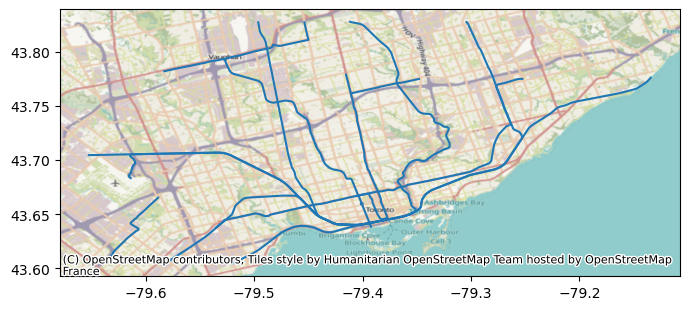

In [19]:
routes_bool_mask = (ttc_routes["STATUS"] == "Existing") | (ttc_routes["STATUS"] == "Existing (To Be Removed)")
existing_ttc_routes = ttc_routes[routes_bool_mask]
display(existing_ttc_routes.drop(columns="geometry"))
ttc_ax = existing_ttc_routes.plot(figsize=(8, 8))
cx.add_basemap(
    ttc_ax,
    crs = wgs84
)

%store existing_ttc_routes

Stored 'existing_ttc_points' (GeoDataFrame)


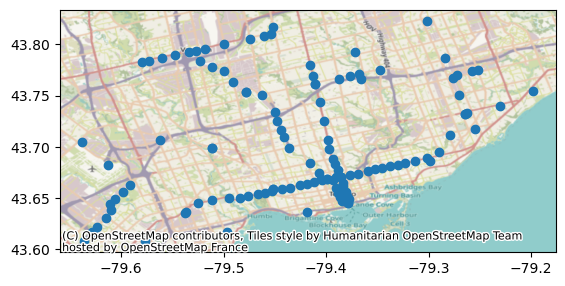

In [20]:
points_bool_mask = (ttc_points["STATUS"] == "Existing") | (ttc_points["STATUS"] == "Existing (To Be Removed)")
existing_ttc_points = ttc_points[points_bool_mask]
itable(existing_ttc_points.drop(columns="geometry"))
ttc_points_ax = existing_ttc_points.plot()
cx.add_basemap(ttc_points_ax, crs = wgs84)

%store existing_ttc_points

### Preparing Polygons for Isochrone Map

In [25]:
# Create polygons using convex hulls on ego graph
existing_ttc_iso_polys = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    for i, center_node in existing_ttc_points["nearest_graph_node"].items():
        if center_node == -1:
            continue
        subgraph = nx.ego_graph(graph, center_node, radius=trip_time, distance='time')
        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        if trip_time not in existing_ttc_iso_polys:
            existing_ttc_iso_polys[trip_time] = gpd.GeoDataFrame(existing_ttc_points)
        else:
            existing_ttc_iso_polys[trip_time].loc[i, "geometry"] = gpd.GeoSeries(data=node_points).unary_union.convex_hull

%store existing_ttc_iso_polys

Stored 'existing_ttc_iso_polys' (dict)


### Create Isochrone Map

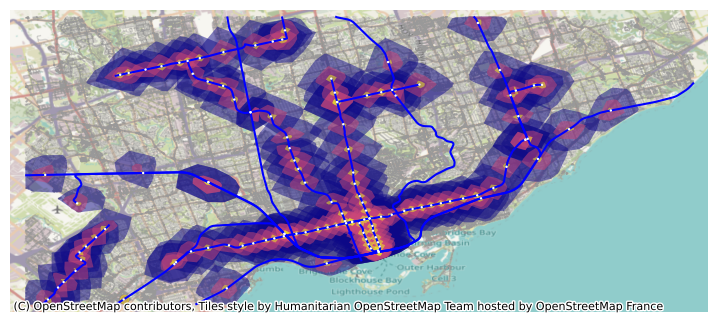

In [56]:
# plot the network then add isochrones as colored descartes polygon patches

fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)

# Add base map
cx.add_basemap(ax, crs = wgs84)

### Calculating Hospital Coverage

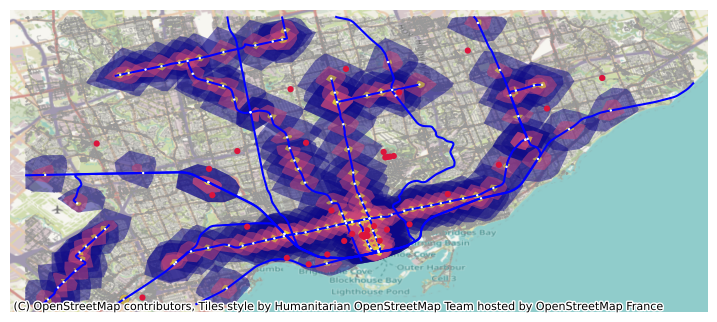

In [57]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_hospitals = hospital_points.plot(ax=ax, color="crimson", edgecolor="none", markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [28]:
hospitals_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in hospital_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    hospitals_within_reach["time"].append(trip_time)
    hospitals_within_reach["reachable"].append(total)

hospitals_within_reach["time"].append(np.inf)
hospitals_within_reach["reachable"].append(len(hospital_points))

hospitals_within_reach = pd.DataFrame(hospitals_within_reach)

hospitals_within_reach["portion"] = hospitals_within_reach["reachable"] / len(hospital_points)

display(hospitals_within_reach)

,time,reachable,portion
0,30.0,26,0.702703
1,15.0,15,0.405405
2,5.0,8,0.216216
3,inf,37,1.000000


### Calculating Pharmacy Coverage

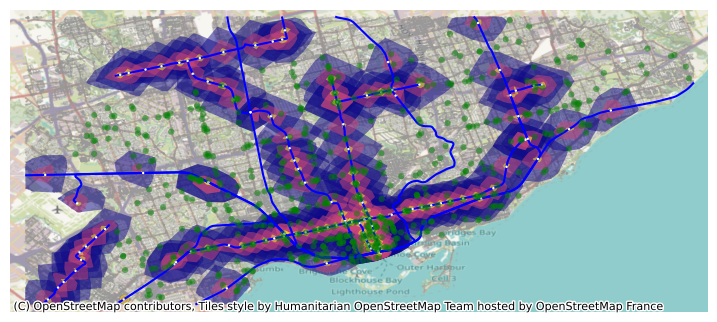

In [69]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_pharmacies = pharmacy_points.plot(ax=ax, color="green", edgecolor="none", alpha=0.5, markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [30]:
pharmacies_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in pharmacy_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    pharmacies_within_reach["time"].append(trip_time)
    pharmacies_within_reach["reachable"].append(total)

pharmacies_within_reach["time"].append(np.inf)
pharmacies_within_reach["reachable"].append(len(pharmacy_points))

pharmacies_within_reach = pd.DataFrame(pharmacies_within_reach)

pharmacies_within_reach["portion"] = pharmacies_within_reach["reachable"] / len(pharmacy_points)

display(pharmacies_within_reach)

,time,reachable,portion
0,30.0,439,0.708065
1,15.0,259,0.417742
2,5.0,111,0.179032
3,inf,620,1.000000


### Calculating Restaurant Coverage

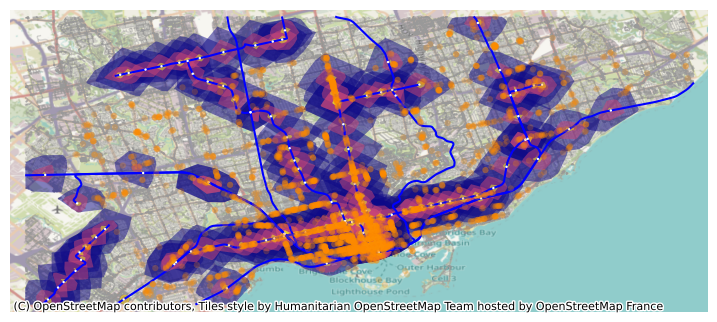

In [59]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_restaurants = restaurant_points.plot(ax=ax, color="darkorange", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [32]:
restaurants_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in restaurant_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    restaurants_within_reach["time"].append(trip_time)
    restaurants_within_reach["reachable"].append(total)

restaurants_within_reach["time"].append(np.inf)
restaurants_within_reach["reachable"].append(len(restaurant_points))

restaurants_within_reach = pd.DataFrame(restaurants_within_reach)

restaurants_within_reach["portion"] = restaurants_within_reach["reachable"] / len(restaurant_points)

display(restaurants_within_reach)

,time,reachable,portion
0,30.0,2517,0.837325
1,15.0,1531,0.509315
2,5.0,711,0.236527
3,inf,3006,1.000000


### Calculating University Coverage

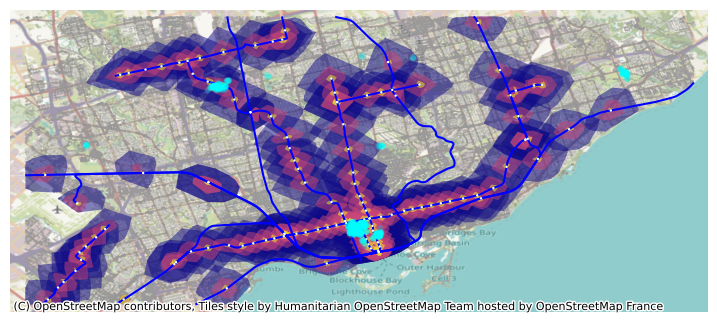

In [60]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_universities = university_points.plot(ax=ax, color="cyan", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [34]:
universities_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in university_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    universities_within_reach["time"].append(trip_time)
    universities_within_reach["reachable"].append(total)

universities_within_reach["time"].append(np.inf)
universities_within_reach["reachable"].append(len(university_points))

universities_within_reach = pd.DataFrame(universities_within_reach)

universities_within_reach["portion"] = universities_within_reach["reachable"] / len(university_points)

display(universities_within_reach)

,time,reachable,portion
0,30.0,437,0.888211
1,15.0,430,0.873984
2,5.0,159,0.323171
3,inf,492,1.000000


### Calculating Shop Coverage

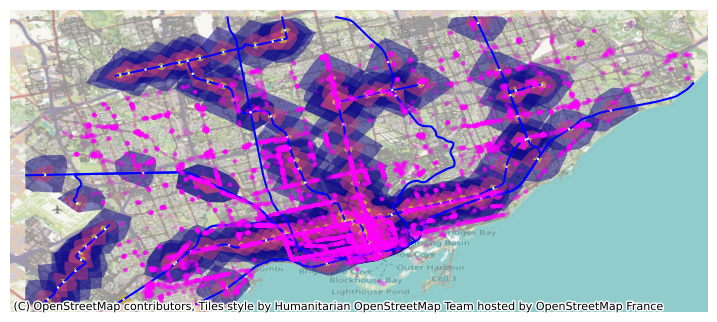

In [61]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_shops = shop_points.plot(ax=ax, color="magenta", edgecolor="none", alpha=0.25, markersize=10, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [36]:
shops_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in shop_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    shops_within_reach["time"].append(trip_time)
    shops_within_reach["reachable"].append(total)

shops_within_reach["time"].append(np.inf)
shops_within_reach["reachable"].append(len(shop_points))

shops_within_reach = pd.DataFrame(shops_within_reach)

shops_within_reach["portion"] = shops_within_reach["reachable"] / len(shop_points)

display(shops_within_reach)

,time,reachable,portion
0,30.0,10166,0.759791
1,15.0,6199,0.463303
2,5.0,2570,0.192078
3,inf,13380,1.000000


### Calculating Residential Coverage

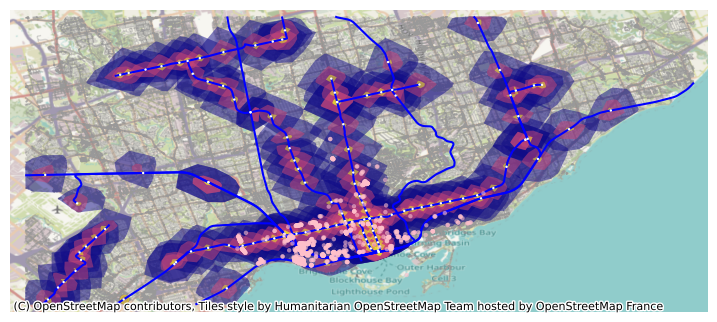

In [28]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_residentials = residential_points.plot(ax=ax, color="pink", edgecolor="none", alpha=0.6, markersize=10, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [24]:
residentials_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in residential_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    residentials_within_reach["time"].append(trip_time)
    residentials_within_reach["reachable"].append(total)

residentials_within_reach["time"].append(np.inf)
residentials_within_reach["reachable"].append(len(residential_points))

residentials_within_reach = pd.DataFrame(residentials_within_reach)

residentials_within_reach["portion"] = residentials_within_reach["reachable"] / len(residential_points)

display(residentials_within_reach)

,time,reachable,portion
0,30.0,1195,0.952191
1,15.0,543,0.432669
2,5.0,43,0.034263
3,inf,1255,1.000000


## Analysis for Future Toronto

### Select Lines and Points in the Future

First, we will remove all non-existing routes and points.

Stored 'future_ttc_routes' (GeoDataFrame)


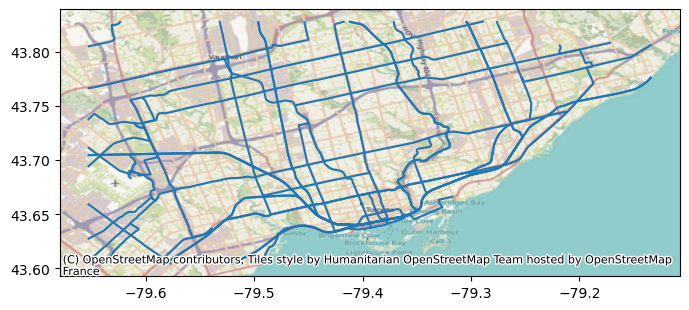

In [37]:
routes_bool_mask = ttc_routes["STATUS"] != "Existing (To Be Removed)"
future_ttc_routes = ttc_routes[routes_bool_mask]
itable(future_ttc_routes.drop(columns="geometry"))
ttc_ax = future_ttc_routes.plot(figsize=(8, 8))
cx.add_basemap(
    ttc_ax,
    crs = wgs84
)

%store future_ttc_routes

Stored 'future_ttc_points' (GeoDataFrame)


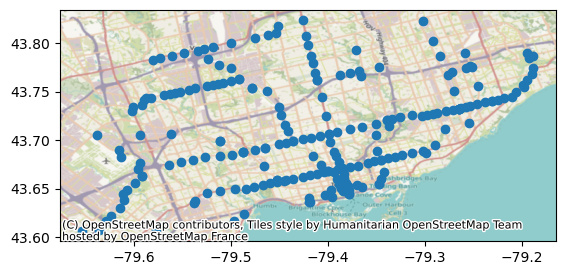

In [38]:
points_bool_mask = ttc_points["STATUS"] != "Existing (To Be Removed)"
future_ttc_points = ttc_points[points_bool_mask]
itable(future_ttc_points.drop(columns="geometry"))
ttc_points_ax = future_ttc_points.plot()
cx.add_basemap(ttc_points_ax, crs = wgs84)

%store future_ttc_points

### Preparing Polygons for Isochrone Map

In [39]:
# color the nodes according to isochrone then plot the street network
future_ttc_iso_polys = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    for i, center_node in future_ttc_points["nearest_graph_node"].items():
        if center_node == -1:
            continue
        subgraph = nx.ego_graph(graph, center_node, radius=trip_time, distance='time')
        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        if trip_time not in future_ttc_iso_polys:
            future_ttc_iso_polys[trip_time] = gpd.GeoDataFrame(future_ttc_points)
        else:
            future_ttc_iso_polys[trip_time].loc[i, "geometry"] = gpd.GeoSeries(data=node_points).unary_union.convex_hull

%store future_ttc_iso_polys

Stored 'future_ttc_iso_polys' (dict)


### Create Isochrone Map

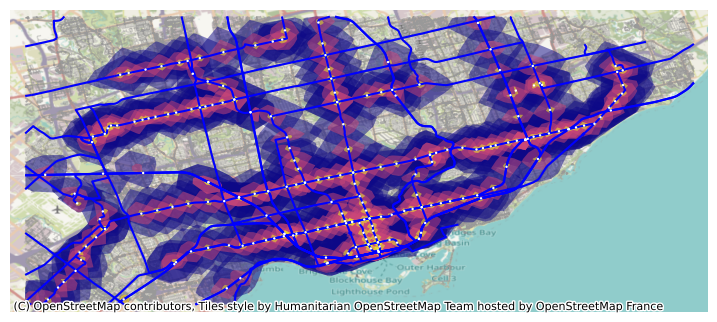

In [62]:
# plot the network then add isochrones as colored descartes polygon patches

fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)

# Add base map
cx.add_basemap(ax, crs = wgs84)

### Calculating Hospital Coverage

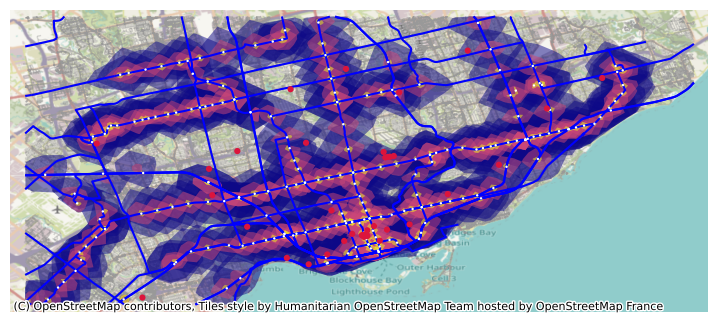

In [63]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_hospitals = hospital_points.plot(ax=ax, color="crimson", edgecolor="none", markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [42]:
hospitals_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in hospital_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    hospitals_within_reach["time"].append(trip_time)
    hospitals_within_reach["reachable"].append(total)

hospitals_within_reach["time"].append(np.inf)
hospitals_within_reach["reachable"].append(len(hospital_points))

hospitals_within_reach = pd.DataFrame(hospitals_within_reach)

hospitals_within_reach["portion"] = hospitals_within_reach["reachable"] / len(hospital_points)

display(hospitals_within_reach)

,time,reachable,portion
0,30.0,34,0.918919
1,15.0,24,0.648649
2,5.0,8,0.216216
3,inf,37,1.000000


### Calculating Pharmacy Coverage

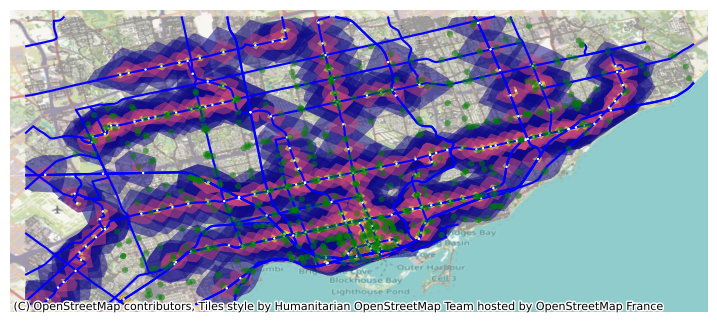

In [68]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_pharmacies = pharmacy_points.plot(ax=ax, color="green", edgecolor="none", alpha=0.5, markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [44]:
pharmacies_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in pharmacy_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    pharmacies_within_reach["time"].append(trip_time)
    pharmacies_within_reach["reachable"].append(total)

pharmacies_within_reach["time"].append(np.inf)
pharmacies_within_reach["reachable"].append(len(pharmacy_points))

pharmacies_within_reach = pd.DataFrame(pharmacies_within_reach)

pharmacies_within_reach["portion"] = pharmacies_within_reach["reachable"] / len(pharmacy_points)

display(pharmacies_within_reach)

,time,reachable,portion
0,30.0,557,0.898387
1,15.0,375,0.604839
2,5.0,177,0.285484
3,inf,620,1.000000


### Calculating Restaurant Coverage

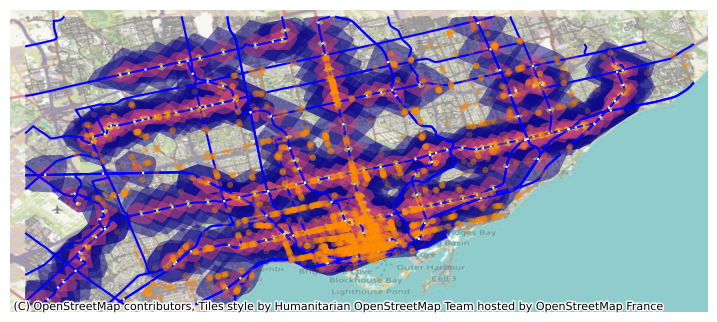

In [65]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_restaurants = restaurant_points.plot(ax=ax, color="darkorange", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [46]:
restaurants_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in restaurant_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    restaurants_within_reach["time"].append(trip_time)
    restaurants_within_reach["reachable"].append(total)

restaurants_within_reach["time"].append(np.inf)
restaurants_within_reach["reachable"].append(len(restaurant_points))

restaurants_within_reach = pd.DataFrame(restaurants_within_reach)

restaurants_within_reach["portion"] = restaurants_within_reach["reachable"] / len(restaurant_points)

display(restaurants_within_reach)

,time,reachable,portion
0,30.0,2835,0.943114
1,15.0,2108,0.701264
2,5.0,957,0.318363
3,inf,3006,1.000000


### Calculating University Coverage

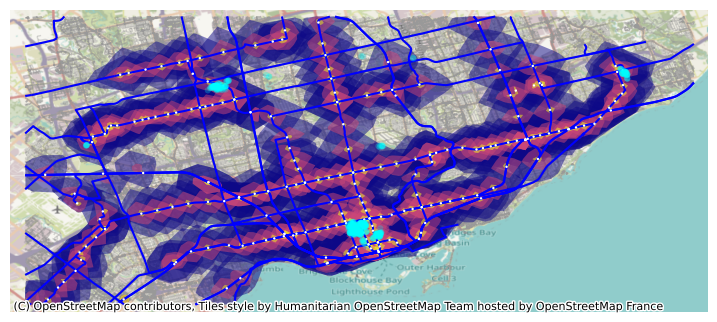

In [66]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_universities = university_points.plot(ax=ax, color="cyan", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [48]:
universities_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in university_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    universities_within_reach["time"].append(trip_time)
    universities_within_reach["reachable"].append(total)

universities_within_reach["time"].append(np.inf)
universities_within_reach["reachable"].append(len(university_points))

universities_within_reach = pd.DataFrame(universities_within_reach)

universities_within_reach["portion"] = universities_within_reach["reachable"] / len(university_points)

display(universities_within_reach)

,time,reachable,portion
0,30.0,487,0.989837
1,15.0,477,0.969512
2,5.0,175,0.355691
3,inf,492,1.000000


### Calculating Shop Coverage

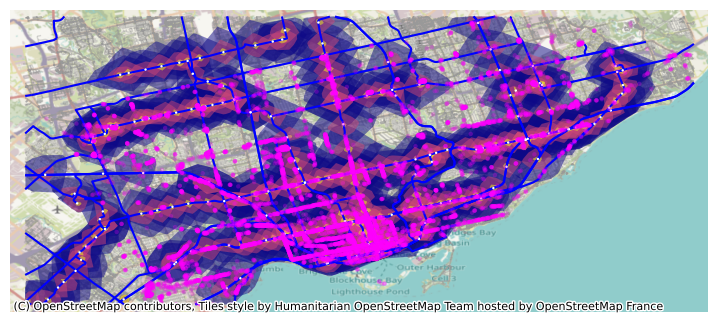

In [67]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_shops = shop_points.plot(ax=ax, color="magenta", edgecolor="none", alpha=0.25, markersize=10, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [50]:
shops_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in shop_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    shops_within_reach["time"].append(trip_time)
    shops_within_reach["reachable"].append(total)

shops_within_reach["time"].append(np.inf)
shops_within_reach["reachable"].append(len(shop_points))

shops_within_reach = pd.DataFrame(shops_within_reach)

shops_within_reach["portion"] = shops_within_reach["reachable"] / len(shop_points)

display(shops_within_reach)

,time,reachable,portion
0,30.0,12159,0.908744
1,15.0,8823,0.659417
2,5.0,3944,0.294768
3,inf,13380,1.000000


### Calculating Residential Coverage

In [ ]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()


added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_residentials = residential_points.plot(ax=ax, color="pink", edgecolor="none", alpha=0.6, markersize=10, zorder=3)

cx.add_basemap(ax, crs = wgs84)

In [29]:
residentials_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in residential_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    residentials_within_reach["time"].append(trip_time)
    residentials_within_reach["reachable"].append(total)

residentials_within_reach["time"].append(np.inf)
residentials_within_reach["reachable"].append(len(residential_points))

residentials_within_reach = pd.DataFrame(residentials_within_reach)

residentials_within_reach["portion"] = residentials_within_reach["reachable"] / len(residential_points)

display(residentials_within_reach)

,time,reachable,portion
0,30.0,1246,0.992829
1,15.0,715,0.569721
2,5.0,90,0.071713
3,inf,1255,1.000000


## Population Projection

We'd like to calculate the growth of populations and see what it may look like by 2030.

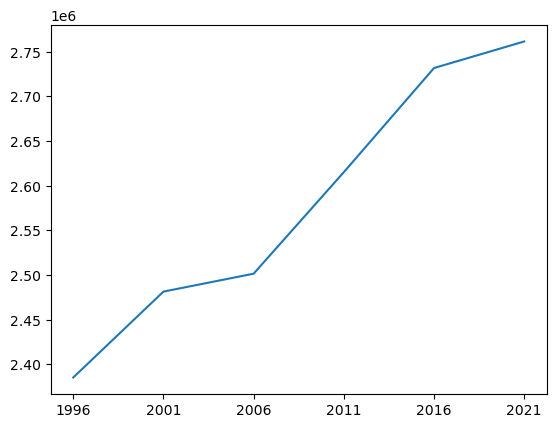

In [166]:
snapshot_names = ["1996", "2001", "2006", "2011", "2016", "2021"]

population_growth_ax = neighbourhood_populations[["1996", "2001", "2006", "2011", "2016", "2021"]].transpose()["Total"].plot()

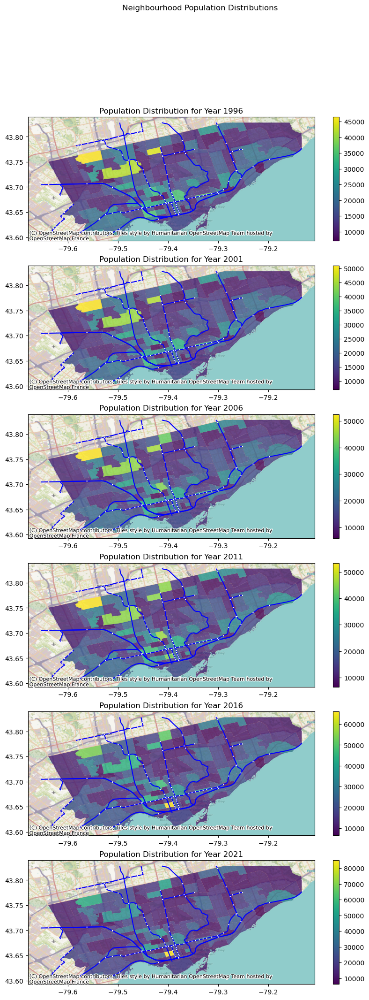

In [193]:
fig, axes = plt.subplots(6, 1, figsize=(10, 24))
axes = axes.ravel()
fig.suptitle("Neighbourhood Population Distributions")
for iax, snapshot in enumerate(snapshot_names):
    ax = axes[iax]
    ax.set_title(f"Population Distribution for Year {snapshot}")
    neighbourhood_bounds.plot(
        ax=ax,
        column=snapshot,
        cmap="viridis",
        legend=True,
        alpha=0.8,
    )
    existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
    existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
    cx.add_basemap(ax, crs=neighbourhood_bounds.crs)